# Azure Computer Vision 4 (Florence)

## Fashion Visual Search - Images analysis

![Image](florence.jpg)

![Image](fashionheader.png)

<br>
<i>Note: this image was generated with Azure Open AI Dall-e 2</i>

### Visual search with vector embeddings
**Vector embeddings** are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

![Image](embeddings.jpg)


### Business applications
- **Digital asset management**: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- **Medical image retrieval**: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- **Security and surveillance**: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- **Forensic image retrieval**: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- **E-commerce**: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- **Fashion and design**: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

### Visual Search Process
![Image](fashionprocess.png)

### Image Retrieval with Azure Computer Vision Documentation
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/concept-image-retrieval
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/how-to/image-retrieval

### Demo images
Demo images are a sample of this collection of images: https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations/data
<br><br>
> Serge Retkowsky | Microsoft | https://github.com/retkowsky | 3rd of May, 2023

## 1. <a name="chapt1"></a> Librairies

In [1]:
import datetime
import glob
import json
import os
import random
import sys
import time

from dotenv import load_dotenv
from PIL import Image

In [2]:
# Getting Azure CV endpoint and key from the azure.env file

load_dotenv("azure.env")
key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

### Importing our specific functions

In [3]:
pyfile = "azure.py"

print("Python file:", pyfile, "Date:", time.ctime(os.path.getmtime(pyfile)))

Python file: azure.py Date: Wed May  3 12:39:04 2023


In [4]:
from azure import (
    describe_image_with_AzureCV4,
    get_image_from_url,
    get_results_using_image,
    get_results_using_prompt,
    remove_background,
    side_by_side_images,
    view_image,
)

## 2. <a name="chapt2"></a> Informations

In [5]:
sys.version

'3.8.5 (default, Sep  4 2020, 07:30:14) \n[GCC 7.3.0]'

In [6]:
print("Today is", datetime.datetime.today())

Today is 2023-05-03 14:42:59.556156


## 3. <a name="chapt3"></a> Our products images

In [7]:
IMAGES_DIR = "fashion"

In [8]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: fashion
Total number of catalog images = 1,473


### Some images

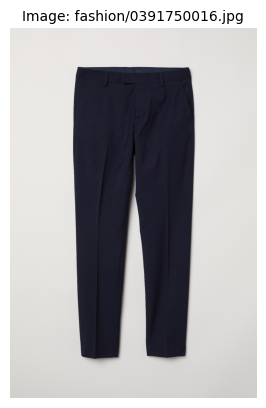

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a pair of pants on a wall = 0.434

   Detected tags:
    clothing           = 1.000
    trouser            = 0.986
    trousers           = 0.895
    pocket             = 0.868
    person             = 0.846
    pants              = 0.437


In [9]:
idx = 1

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

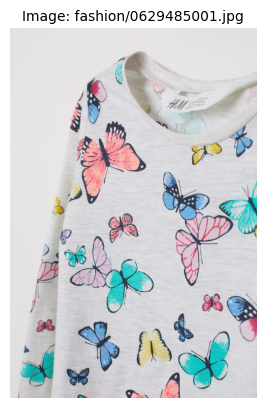

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a shirt with butterflies on it = 0.629

   Detected tags:
    butterfly          = 0.962
    moths and butterflies = 0.912
    pattern (fashion design) = 0.908
    invertebrate       = 0.883
    insect             = 0.881


In [10]:
idx = 500

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

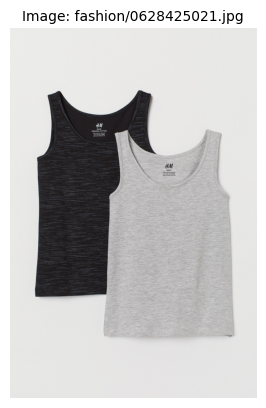

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a black and grey tank tops = 0.539

   Detected tags:
    clothing           = 0.991
    pattern (fashion design) = 0.920
    casual dress       = 0.881
    dress              = 0.739
    fashion            = 0.690
    textile            = 0.417


In [11]:
idx = int(random.uniform(0, len(image_files)))

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

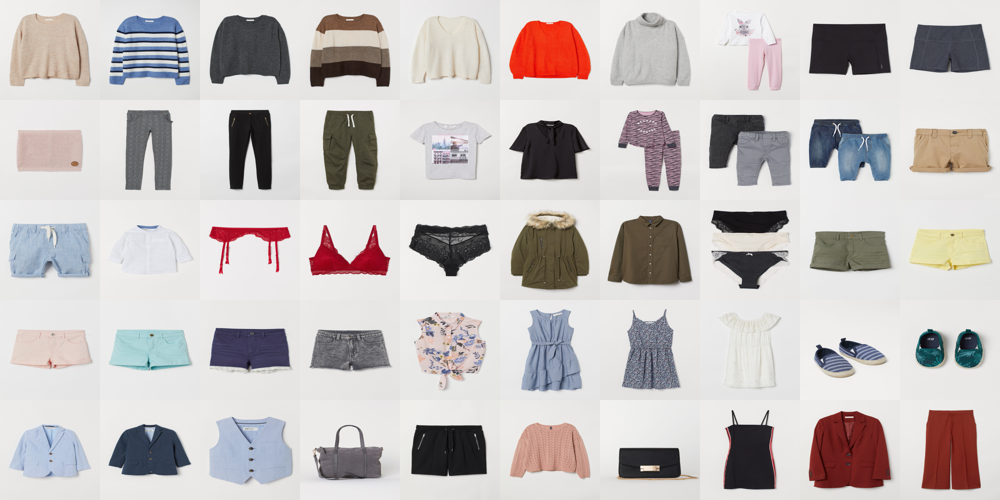

In [12]:
num_images_per_row = 10
num_images_per_col = 5

img_size = 200
start = 1000
samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

for idx, image_file in enumerate(samples):
    img = Image.open(image_file)
    img = img.resize((img_size, img_size))
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

## 4. <a name="chapt4"></a> Loading vector embeddings

In [13]:
JSON_DIR = "json"

glob.glob(JSON_DIR + "/*.json")

['json/img_embed_03May2023_143839.json']

In [14]:
print("Importing vectors embeddings...")

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_03May2023_143839.json

Done: number of imported vector embeddings = 1,473


## 5. <a name="chapt5"></a> Visual search using a field image

We can use a reference image and find the most similar images.
In this demo we will use the reference image without its background
(Azure Computer Vision 4 can automatically remove the background). The search will be made using the image without its background.


In [15]:
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Total number of catalog images = 1,473


In [16]:
TEST_DIR = "test"

test_images = glob.glob(f"{TEST_DIR}/*")
print(f"Total number of test images = {len(test_images)}")

Total number of test images = 6


### Test 1

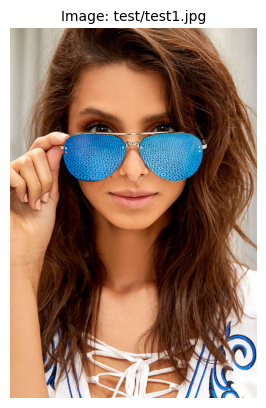

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a woman wearing blue sunglasses = 0.501

   Detected tags:
    human face         = 0.990
    person             = 0.988
    fashion accessory  = 0.947
    goggles            = 0.931
    long hair          = 0.930
    clothing           = 0.924
    lipstick           = 0.915
    lip                = 0.911
    eyewear            = 0.894
    cool               = 0.868
    photo shoot        = 0.868
    cosmetics          = 0.866
    woman              = 0.864
    fashion            = 0.857
    lip gloss          = 0.856
    throat             = 0.847
    eyelash            = 0.843
    lady               = 0.842
    model              = 0.841
    girl               = 0.671
    hair               = 0.664
    wearing            = 0.645
    sunglasses         = 0.571


In [17]:
reference_image = test_images[0]

view_image(reference_image)
describe_image_with_AzureCV4(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


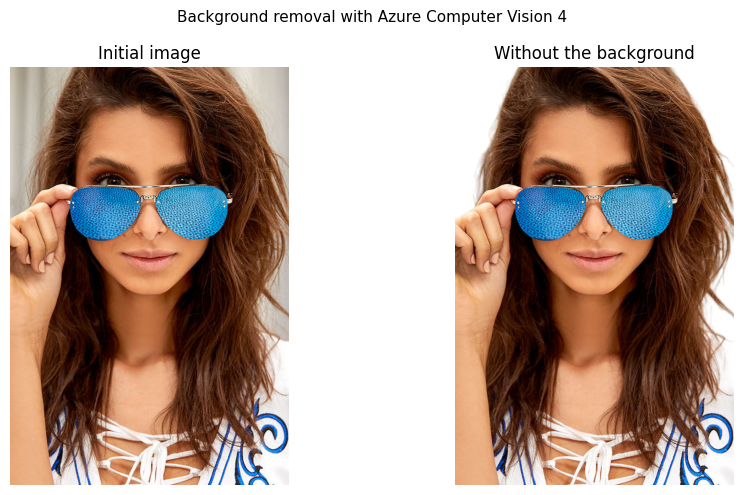

In [18]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0620319010.jpg with similarity index = 0.6377257626148537
002 fashion/0646754002.jpg with similarity index = 0.6054785394790066
003 fashion/0620139003.jpg with similarity index = 0.5794793635515959
004 fashion/0623350001.jpg with similarity index = 0.5549244448263634
005 fashion/0398959003.jpg with similarity index = 0.5412000112429294
006 fashion/0629390001.jpg with similarity index = 0.537345414554501


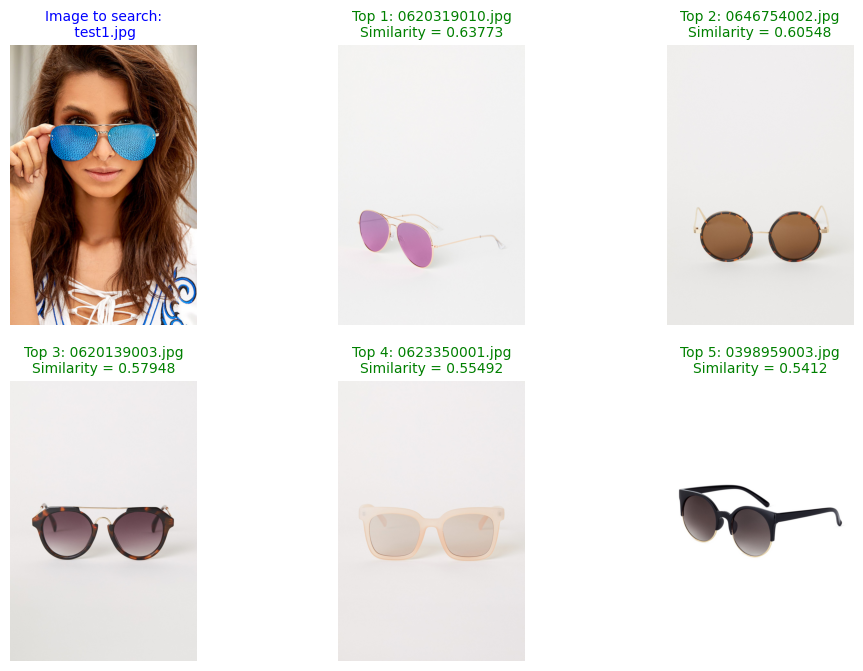

 2023-05-03 14:43:18 Powered by Azure Computer Vision Florence


,image_file,similarity
75,fashion/0620319010.jpg,0.637726
732,fashion/0646754002.jpg,0.605479
49,fashion/0620139003.jpg,0.579479
205,fashion/0623350001.jpg,0.554924
26,fashion/0398959003.jpg,0.541200
...,...,...
383,fashion/0626443007.jpg,0.234865
1259,fashion/0696991021.jpg,0.230844
602,fashion/0641748010.jpg,0.227825
1071,fashion/0694297002.jpg,0.221431


In [19]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 2

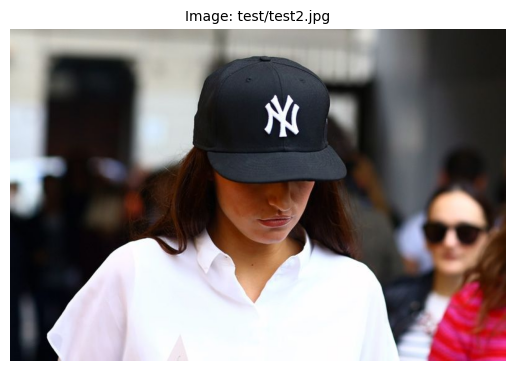

In [20]:
reference_image = test_images[1]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


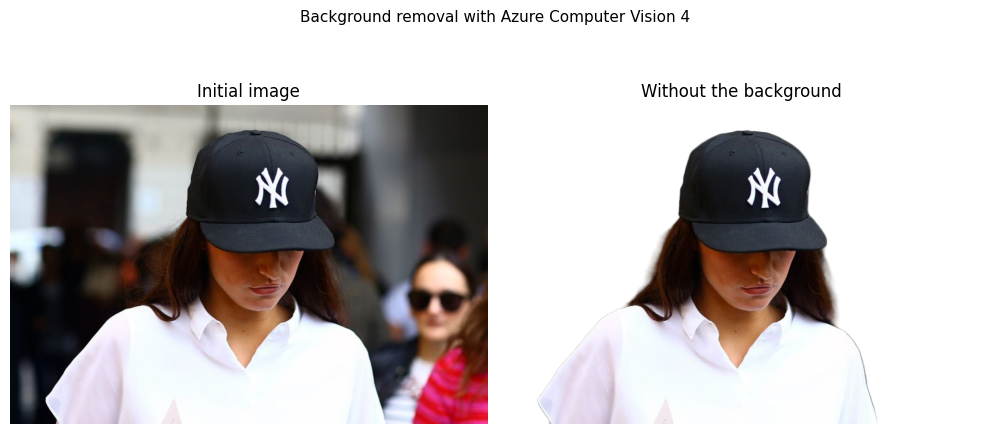

In [21]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0694739001.jpg with similarity index = 0.6110562261988965
002 fashion/0694739003.jpg with similarity index = 0.5807421244207311
003 fashion/0694739020.jpg with similarity index = 0.5655665082180684
004 fashion/0694739030.jpg with similarity index = 0.5606894236791033
005 fashion/0628750003.jpg with similarity index = 0.5440529374893741
006 fashion/0391032009.jpg with similarity index = 0.5381496577028888


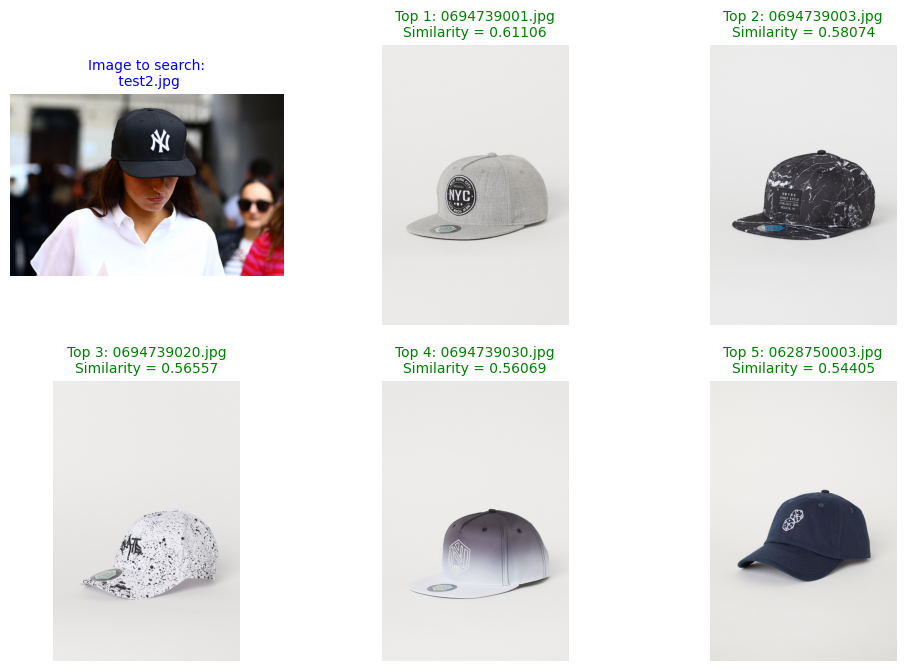

 2023-05-03 14:43:24 Powered by Azure Computer Vision Florence


,image_file,similarity
1099,fashion/0694739001.jpg,0.611056
1100,fashion/0694739003.jpg,0.580742
1101,fashion/0694739020.jpg,0.565567
1102,fashion/0694739030.jpg,0.560689
467,fashion/0628750003.jpg,0.544053
...,...,...
1324,fashion/0697814001.jpg,0.232860
1062,fashion/0694131017.jpg,0.231236
1279,fashion/0697082010.jpg,0.225333
1278,fashion/0697082008.jpg,0.224482


In [22]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 3

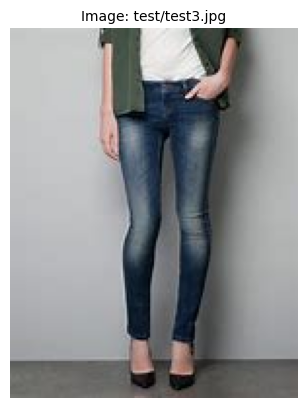

In [23]:
reference_image = test_images[2]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


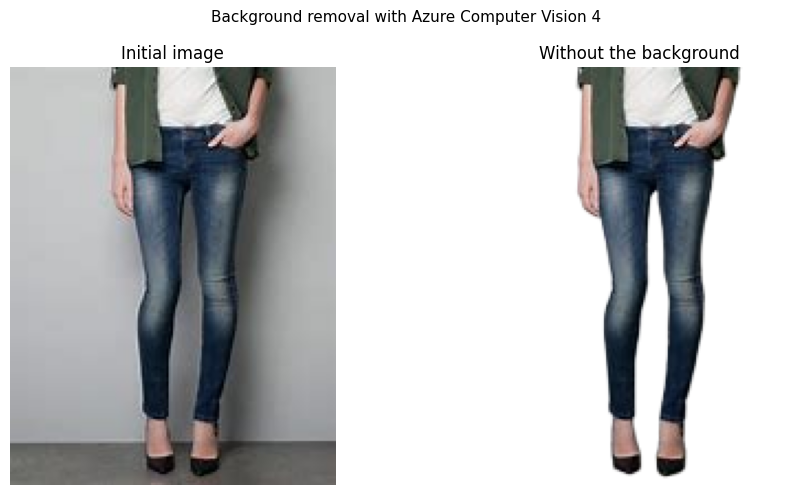

In [24]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0624251001.jpg with similarity index = 0.7144765869790483
002 fashion/0625047001.jpg with similarity index = 0.6973624901426241
003 fashion/0399136060.jpg with similarity index = 0.6965399442900041
004 fashion/0640331007.jpg with similarity index = 0.6965140339645908
005 fashion/0698387005.jpg with similarity index = 0.6945410712229646
006 fashion/0624257005.jpg with similarity index = 0.6909563624534346


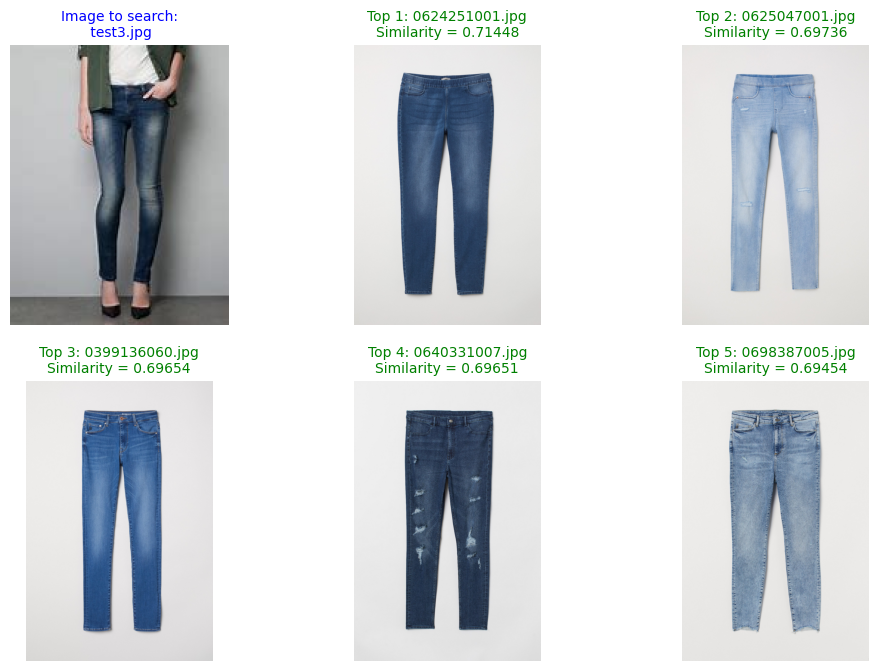

 2023-05-03 14:43:29 Powered by Azure Computer Vision Florence


,image_file,similarity
247,fashion/0624251001.jpg,0.714477
290,fashion/0625047001.jpg,0.697362
35,fashion/0399136060.jpg,0.696540
550,fashion/0640331007.jpg,0.696514
1360,fashion/0698387005.jpg,0.694541
...,...,...
1125,fashion/0695063001.jpg,0.323334
506,fashion/0629656005.jpg,0.322783
629,fashion/0642779001.jpg,0.304185
1286,fashion/0697097003.jpg,0.291146


In [25]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 4

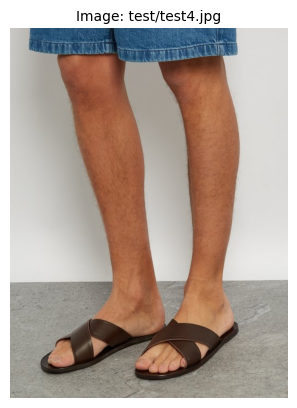

In [26]:
reference_image = test_images[3]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


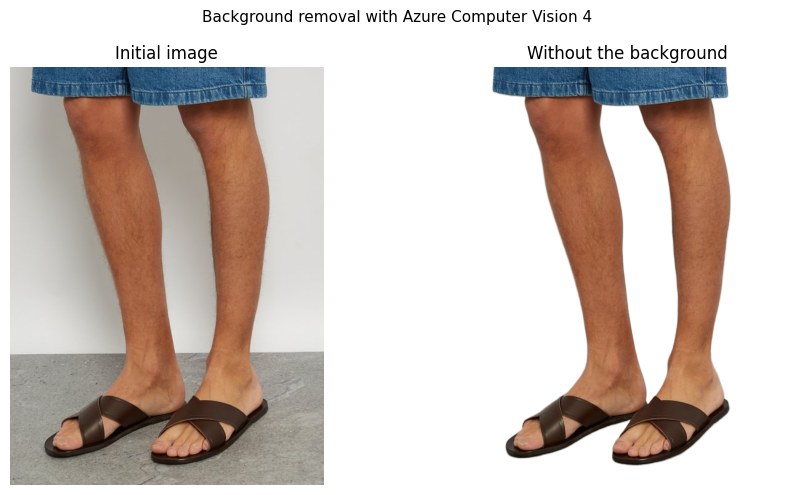

In [27]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0640989002.jpg with similarity index = 0.6548669378859923
002 fashion/0623934002.jpg with similarity index = 0.6198452402475157
003 fashion/0621915004.jpg with similarity index = 0.6072409349844653
004 fashion/0620608001.jpg with similarity index = 0.5882346282139859
005 fashion/0620179001.jpg with similarity index = 0.5793969809669476
006 fashion/0629416001.jpg with similarity index = 0.5708222771332624


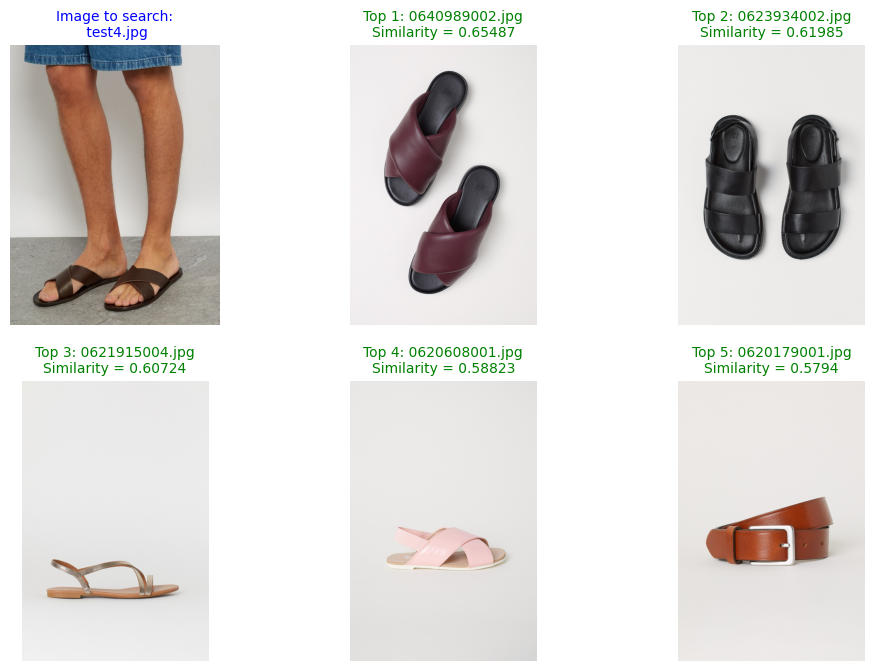

 2023-05-03 14:43:35 Powered by Azure Computer Vision Florence


,image_file,similarity
580,fashion/0640989002.jpg,0.654867
229,fashion/0623934002.jpg,0.619845
145,fashion/0621915004.jpg,0.607241
92,fashion/0620608001.jpg,0.588235
51,fashion/0620179001.jpg,0.579397
...,...,...
742,fashion/0646811010.jpg,0.240940
640,fashion/0642975002.jpg,0.236974
681,fashion/0644678006.jpg,0.236342
401,fashion/0626648003.jpg,0.234406


In [28]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 5

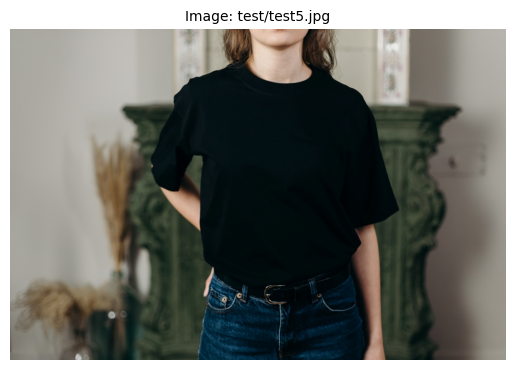

In [29]:
reference_image = test_images[4]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


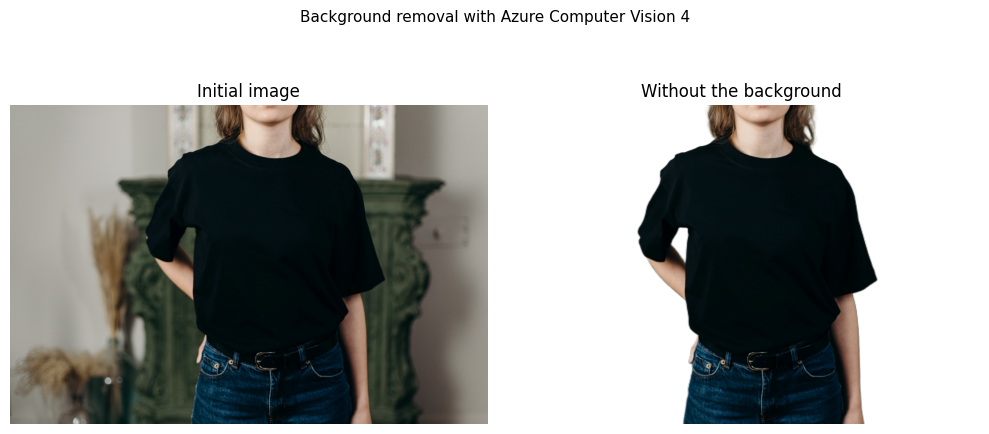

In [30]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 2 images:

001 fashion/0622444001.jpg with similarity index = 0.7065601944880456
002 fashion/0629420001.jpg with similarity index = 0.6812849897719024


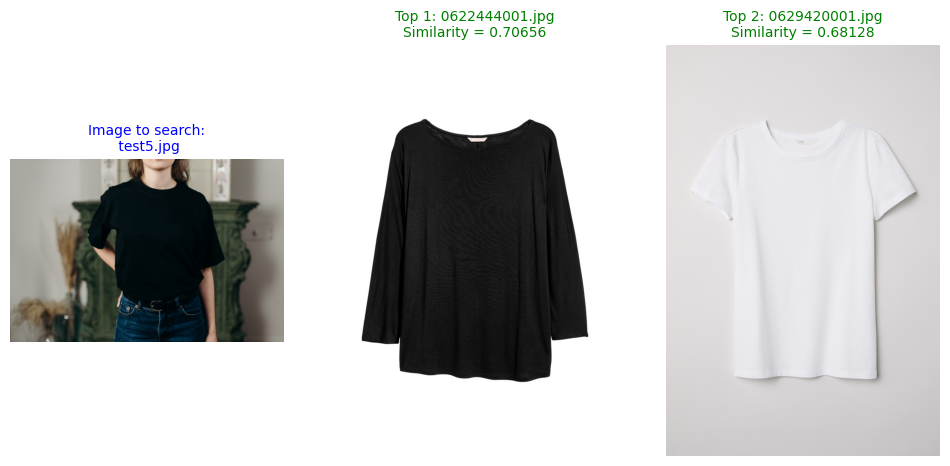

 2023-05-03 14:43:41 Powered by Azure Computer Vision Florence


,image_file,similarity
167,fashion/0622444001.jpg,0.706560
493,fashion/0629420001.jpg,0.681285
349,fashion/0625939002.jpg,0.676974
350,fashion/0625939017.jpg,0.666844
316,fashion/0625321003.jpg,0.659933
...,...,...
973,fashion/0692705001.jpg,0.306432
206,fashion/0623374005.jpg,0.305920
707,fashion/0645920004.jpg,0.304480
1122,fashion/0695043004.jpg,0.299513


In [31]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=2, disp=True
)

### Test 6

In [32]:
# We can download an image from an url
image_URL = "https://github.com/retkowsky/images/blob/master/fashion_image.jpg?raw=true"
reference_image = "download.jpg"

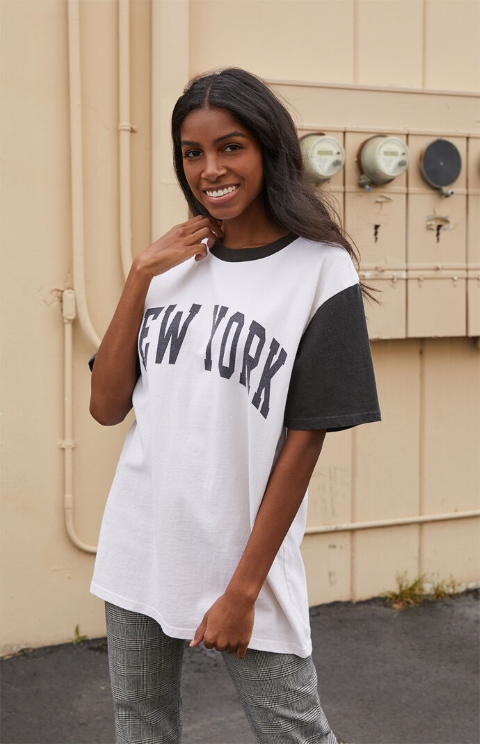

In [33]:
image = get_image_from_url(image_URL)
image

Removing background from the image using Azure Computer Vision 4.0...
Done


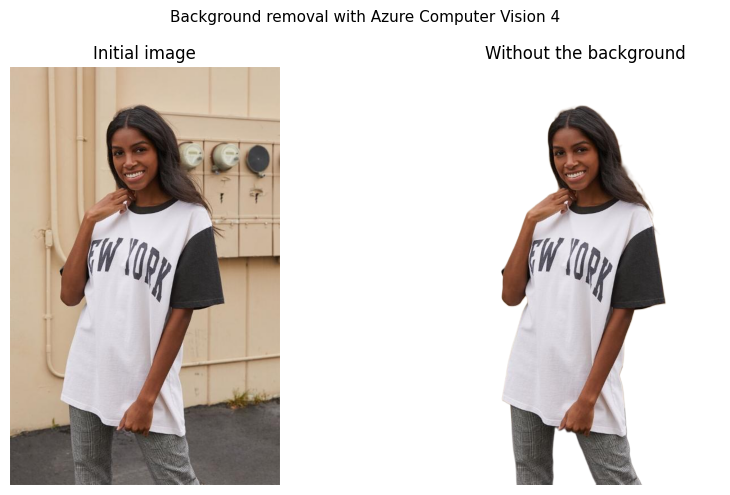

In [34]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0699923102.jpg with similarity index = 0.7304142936108393
002 fashion/0648703010.jpg with similarity index = 0.6889280755487137
003 fashion/0642973002.jpg with similarity index = 0.6656518757587296
004 fashion/0649440014.jpg with similarity index = 0.6535719575638764
005 fashion/0641748019.jpg with similarity index = 0.6041725030299526
006 fashion/0698943005.jpg with similarity index = 0.5917617259667036


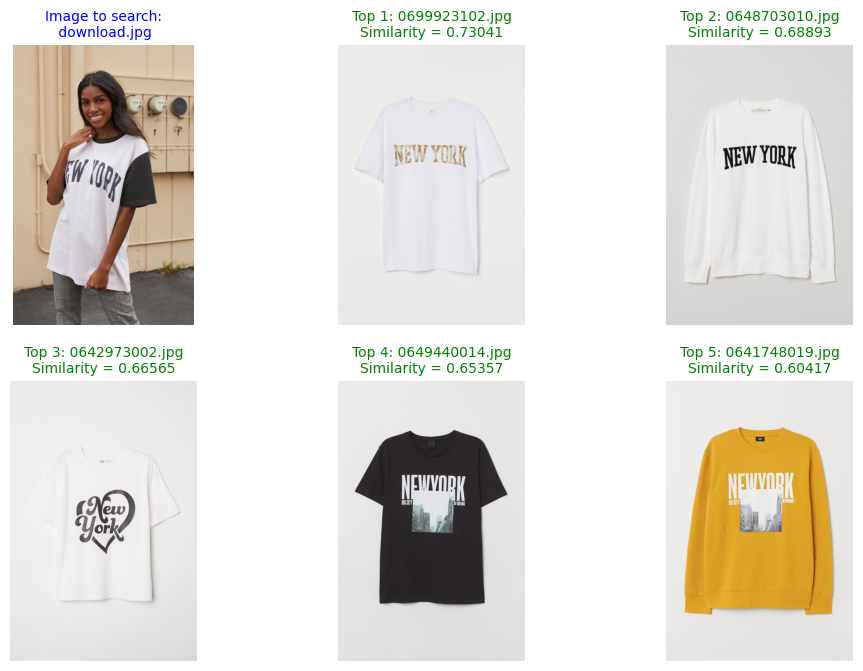

 2023-05-03 14:43:47 Powered by Azure Computer Vision Florence


,image_file,similarity
1468,fashion/0699923102.jpg,0.730414
816,fashion/0648703010.jpg,0.688928
639,fashion/0642973002.jpg,0.665652
843,fashion/0649440014.jpg,0.653572
603,fashion/0641748019.jpg,0.604173
...,...,...
723,fashion/0646429003.jpg,0.280076
1206,fashion/0696201003.jpg,0.273920
341,fashion/0625722001.jpg,0.270192
287,fashion/0625027008.jpg,0.268887


In [35]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

## 6. <a name="chapt6"></a> Visual search using some text

We can use some prompt (text) to find some articles in our catalog images.

### Test 1

In [36]:
query = "shirt with stripped lines on it"


Similar images using query = shirt with stripped lines on it


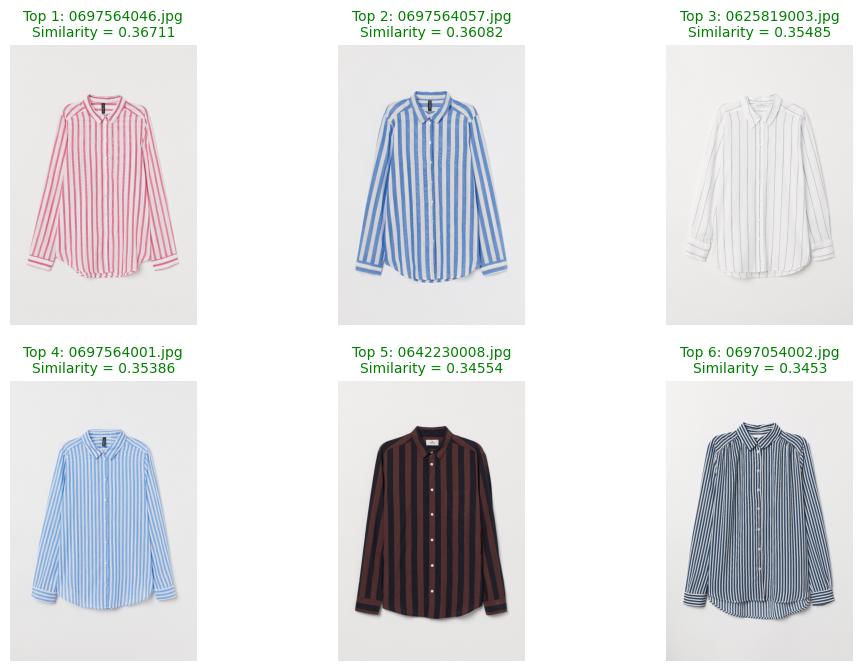

 2023-05-03 14:43:50 Powered by Azure Computer Vision Florence


,image_file,similarity
1313,fashion/0697564046.jpg,0.367112
1315,fashion/0697564057.jpg,0.360816
346,fashion/0625819003.jpg,0.354853
1309,fashion/0697564001.jpg,0.353859
617,fashion/0642230008.jpg,0.345542
...,...,...
1118,fashion/0695001001.jpg,0.103353
676,fashion/0644370001.jpg,0.100064
973,fashion/0692705001.jpg,0.095091
599,fashion/0641521002.jpg,0.092736


In [37]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 2

In [38]:
query = "torn blue jeans"


Similar images using query = torn blue jeans


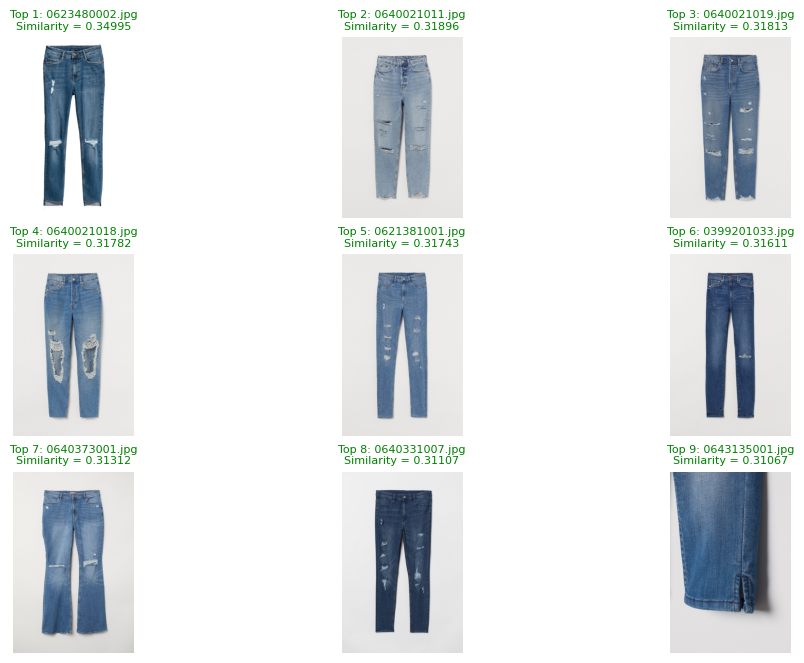

 2023-05-03 14:43:54 Powered by Azure Computer Vision Florence


,image_file,similarity
209,fashion/0623480002.jpg,0.349950
520,fashion/0640021011.jpg,0.318956
522,fashion/0640021019.jpg,0.318128
521,fashion/0640021018.jpg,0.317820
113,fashion/0621381001.jpg,0.317432
...,...,...
1228,fashion/0696628002.jpg,0.073250
1212,fashion/0696316001.jpg,0.070424
1305,fashion/0697506001.jpg,0.068023
1118,fashion/0695001001.jpg,0.067043


In [39]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 3

In [40]:
query = "red dress with long sleeves"


Similar images using query = red dress with long sleeves


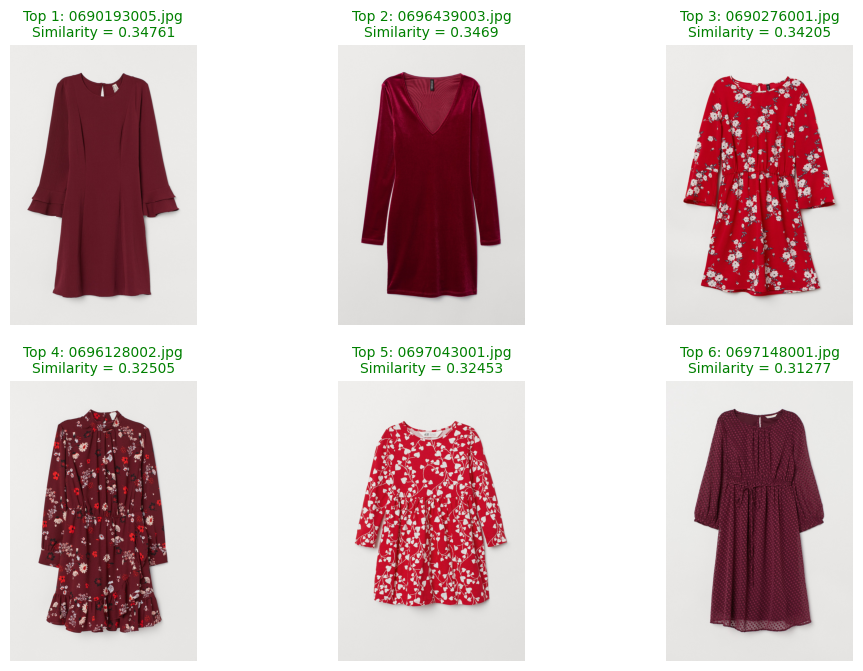

 2023-05-03 14:43:57 Powered by Azure Computer Vision Florence


,image_file,similarity
866,fashion/0690193005.jpg,0.347610
1221,fashion/0696439003.jpg,0.346895
870,fashion/0690276001.jpg,0.342048
1194,fashion/0696128002.jpg,0.325048
1263,fashion/0697043001.jpg,0.324527
...,...,...
264,fashion/0624543063.jpg,0.036891
1181,fashion/0695803006.jpg,0.035629
1100,fashion/0694739003.jpg,0.034977
141,fashion/0621768001.jpg,0.033994


In [41]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 4

In [42]:
query = "dress with flowers"


Similar images using query = dress with flowers


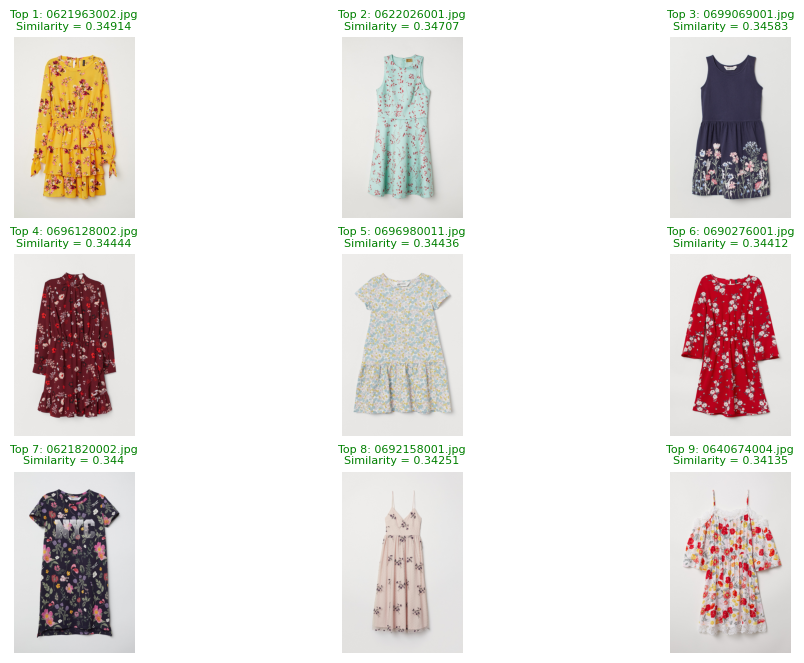

 2023-05-03 14:44:01 Powered by Azure Computer Vision Florence


,image_file,similarity
149,fashion/0621963002.jpg,0.349142
150,fashion/0622026001.jpg,0.347071
1404,fashion/0699069001.jpg,0.345828
1194,fashion/0696128002.jpg,0.344438
1255,fashion/0696980011.jpg,0.344365
...,...,...
141,fashion/0621768001.jpg,0.079256
134,fashion/0621760008.jpg,0.077832
319,fashion/0625420001.jpg,0.077002
760,fashion/0647207008.jpg,0.066001


In [43]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 5

In [44]:
query = "pink shoes"


Similar images using query = pink shoes


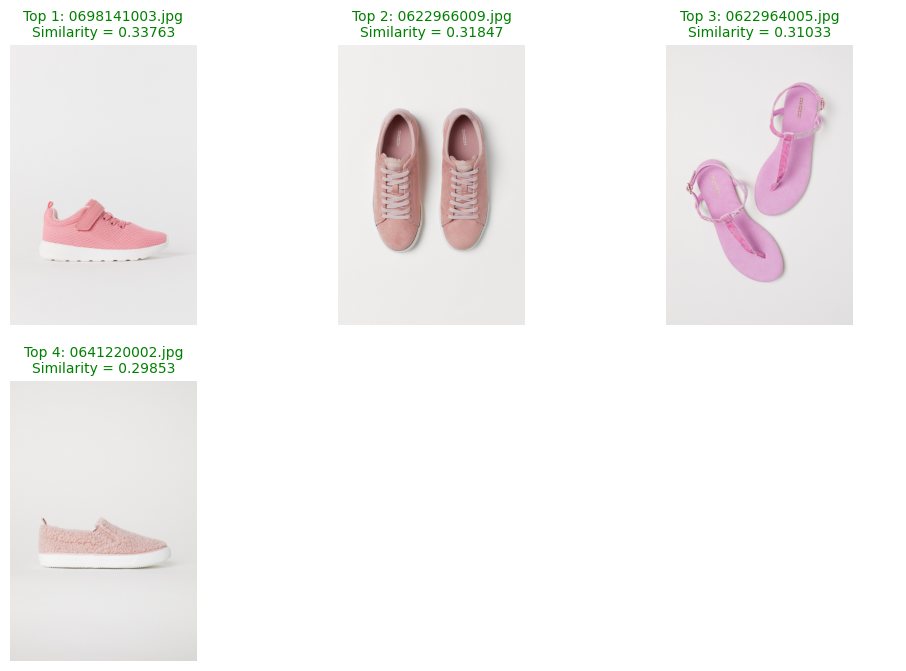

 2023-05-03 14:44:04 Powered by Azure Computer Vision Florence


,image_file,similarity
1343,fashion/0698141003.jpg,0.337628
187,fashion/0622966009.jpg,0.318475
186,fashion/0622964005.jpg,0.310331
592,fashion/0641220002.jpg,0.298532
336,fashion/0625662004.jpg,0.292164
...,...,...
1095,fashion/0694709003.jpg,0.068989
1097,fashion/0694709017.jpg,0.068300
1146,fashion/0695442001.jpg,0.064134
1143,fashion/0695411001.jpg,0.059900


In [45]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 6

In [46]:
query = "ray-ban with yellow frames"


Similar images using query = ray-ban with yellow frames


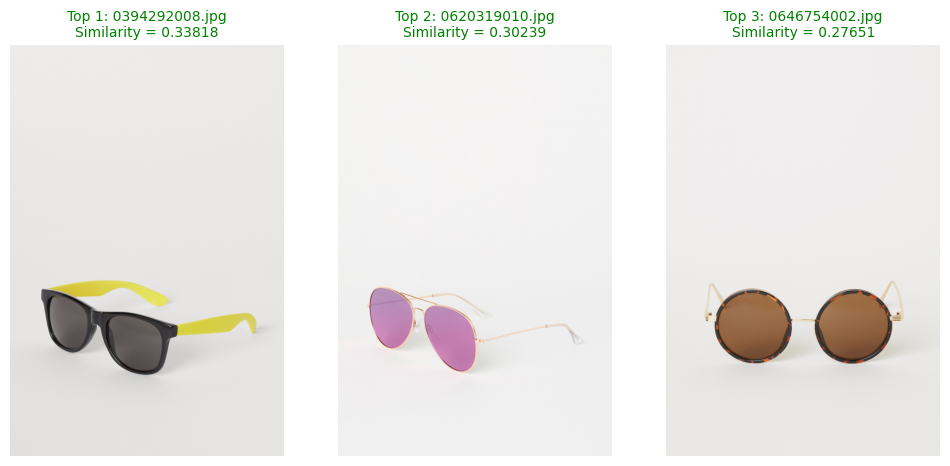

 2023-05-03 14:44:06 Powered by Azure Computer Vision Florence


,image_file,similarity
7,fashion/0394292008.jpg,0.338182
75,fashion/0620319010.jpg,0.302393
732,fashion/0646754002.jpg,0.276511
733,fashion/0646756002.jpg,0.274846
205,fashion/0623350001.jpg,0.262411
...,...,...
1427,fashion/0699349002.jpg,0.077834
181,fashion/0622955007.jpg,0.077604
348,fashion/0625930001.jpg,0.075700
571,fashion/0640735003.jpg,0.075066


In [47]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 7

In [48]:
query = "shirt with NYC written on it"


Similar images using query = shirt with NYC written on it


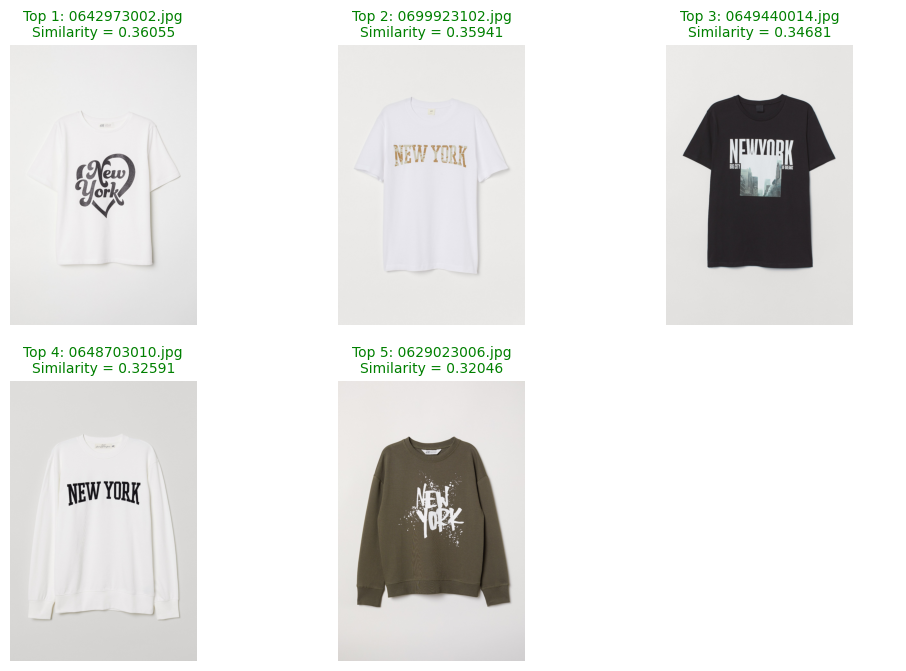

 2023-05-03 14:44:09 Powered by Azure Computer Vision Florence


,image_file,similarity
639,fashion/0642973002.jpg,0.360545
1468,fashion/0699923102.jpg,0.359405
843,fashion/0649440014.jpg,0.346810
816,fashion/0648703010.jpg,0.325906
484,fashion/0629023006.jpg,0.320463
...,...,...
92,fashion/0620608001.jpg,0.058691
246,fashion/0624216001.jpg,0.055033
580,fashion/0640989002.jpg,0.053858
1118,fashion/0695001001.jpg,0.047941


In [49]:
get_results_using_prompt(query, image_files, list_emb, topn=5, disp=False)

### Test 8

In [50]:
query = "bag with golden lace"


Similar images using query = bag with golden lace


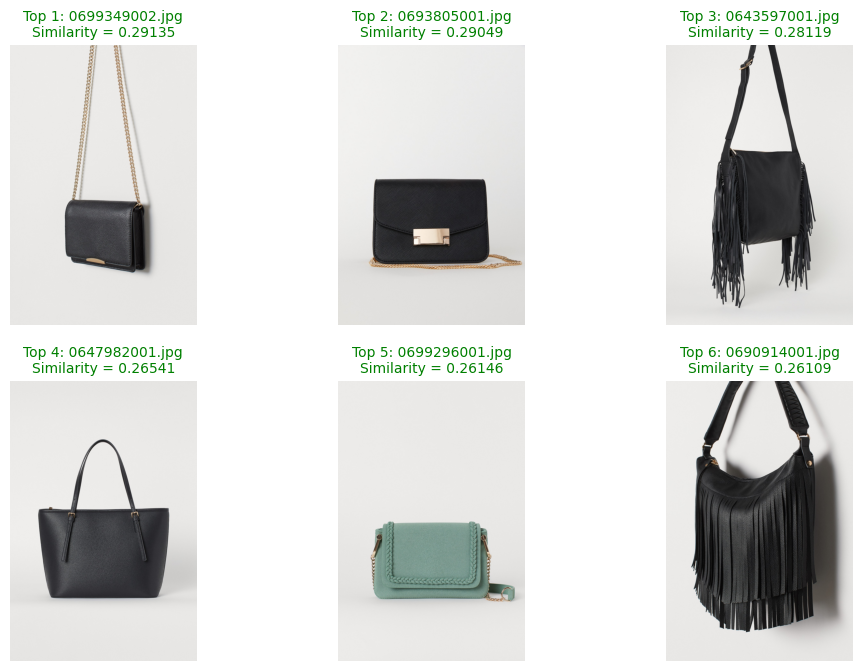

 2023-05-03 14:44:12 Powered by Azure Computer Vision Florence


,image_file,similarity
1427,fashion/0699349002.jpg,0.291347
1046,fashion/0693805001.jpg,0.290492
658,fashion/0643597001.jpg,0.281194
786,fashion/0647982001.jpg,0.265406
1423,fashion/0699296001.jpg,0.261458
...,...,...
722,fashion/0646195001.jpg,0.058648
258,fashion/0624486091.jpg,0.058387
1146,fashion/0695442001.jpg,0.050732
141,fashion/0621768001.jpg,0.049013


In [51]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 9

In [52]:
query = "dreams"

Top 3 images:

001 fashion/0620008004.jpg with similarity index = 0.28529606285894266
002 fashion/0625648002.jpg with similarity index = 0.25675310885251107
003 fashion/0640536001.jpg with similarity index = 0.23733373660105048

Similar images using query = dreams


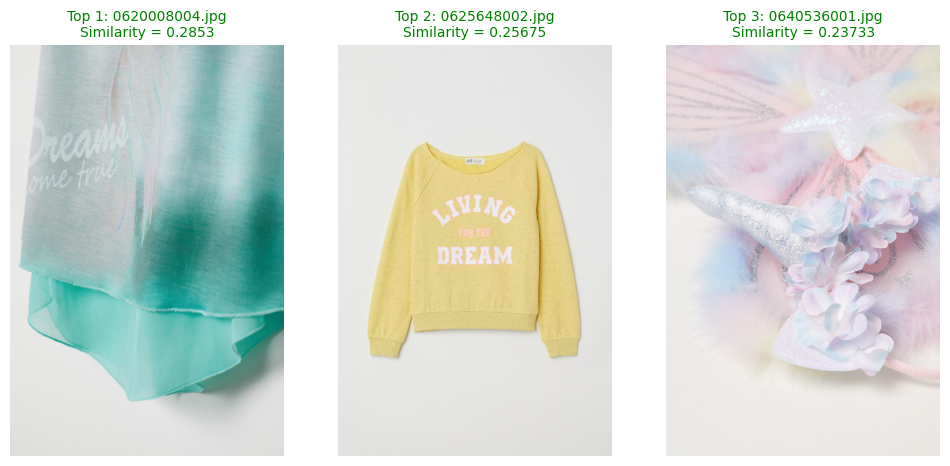

 2023-05-03 14:44:14 Powered by Azure Computer Vision Florence


,image_file,similarity
43,fashion/0620008004.jpg,0.285296
332,fashion/0625648002.jpg,0.256753
557,fashion/0640536001.jpg,0.237334
468,fashion/0628755002.jpg,0.229552
303,fashion/0625179002.jpg,0.226172
...,...,...
411,fashion/0626705004.jpg,0.115115
705,fashion/0645891001.jpg,0.114426
926,fashion/0691527002.jpg,0.114034
452,fashion/0628499008.jpg,0.112888


In [53]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=True)

### Test 10

In [54]:
query = "article with a bird"


Similar images using query = article with a bird


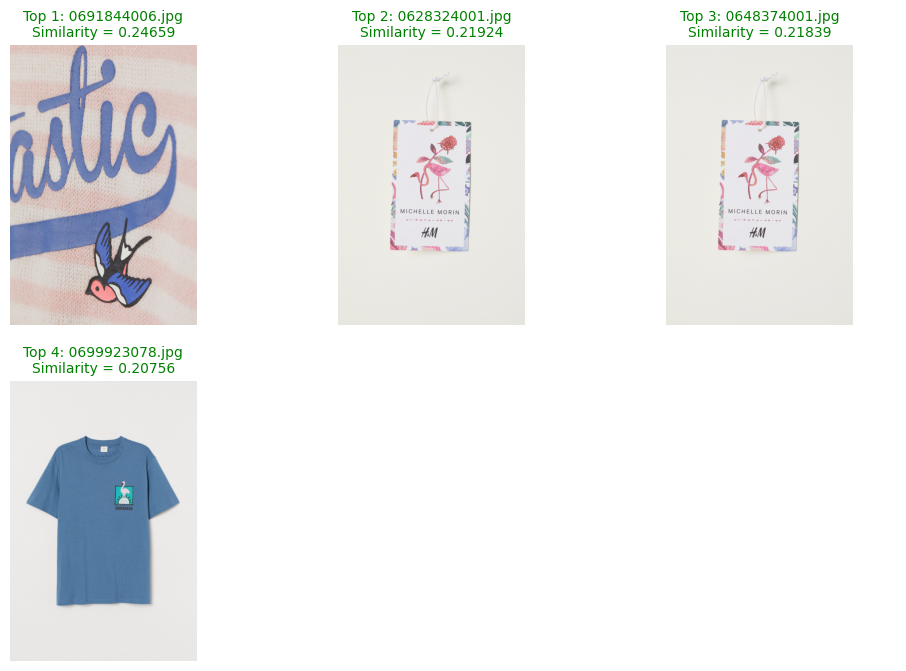

 2023-05-03 14:44:17 Powered by Azure Computer Vision Florence


,image_file,similarity
946,fashion/0691844006.jpg,0.246591
441,fashion/0628324001.jpg,0.219237
803,fashion/0648374001.jpg,0.218390
1465,fashion/0699923078.jpg,0.207564
468,fashion/0628755002.jpg,0.199305
...,...,...
571,fashion/0640735003.jpg,0.060267
135,fashion/0621760009.jpg,0.059809
26,fashion/0398959003.jpg,0.058300
1377,fashion/0698647010.jpg,0.045812


In [55]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 11

In [56]:
query = "Italian or Japanese cities"


Similar images using query = Italian or Japanese cities


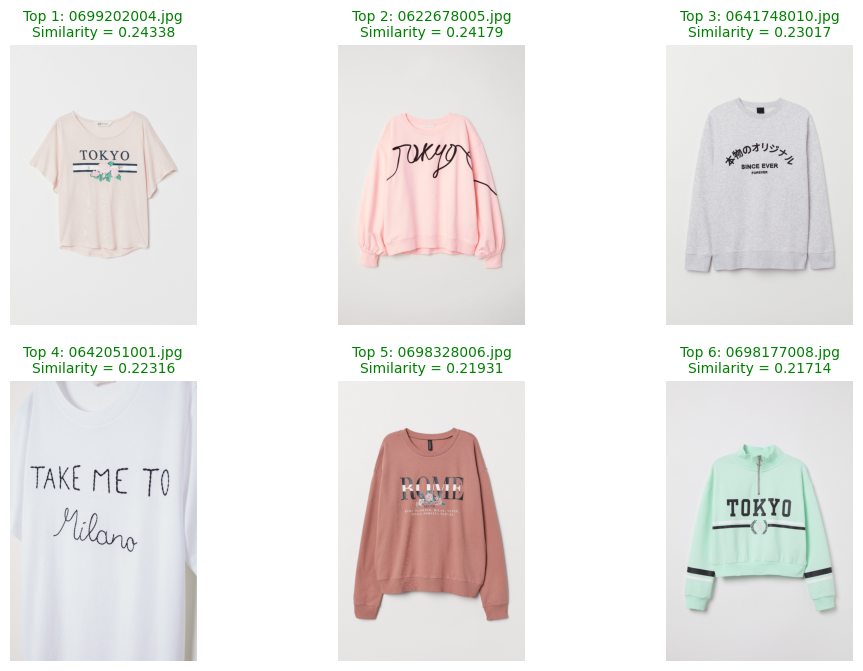

 2023-05-03 14:44:20 Powered by Azure Computer Vision Florence


,image_file,similarity
1417,fashion/0699202004.jpg,0.243379
169,fashion/0622678005.jpg,0.241787
602,fashion/0641748010.jpg,0.230174
611,fashion/0642051001.jpg,0.223163
1356,fashion/0698328006.jpg,0.219311
...,...,...
659,fashion/0643628003.jpg,0.091012
652,fashion/0643350001.jpg,0.090554
1199,fashion/0696148002.jpg,0.090304
172,fashion/0622845004.jpg,0.088329


In [57]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 12

In [58]:
query = "leather belt"


Similar images using query = leather belt


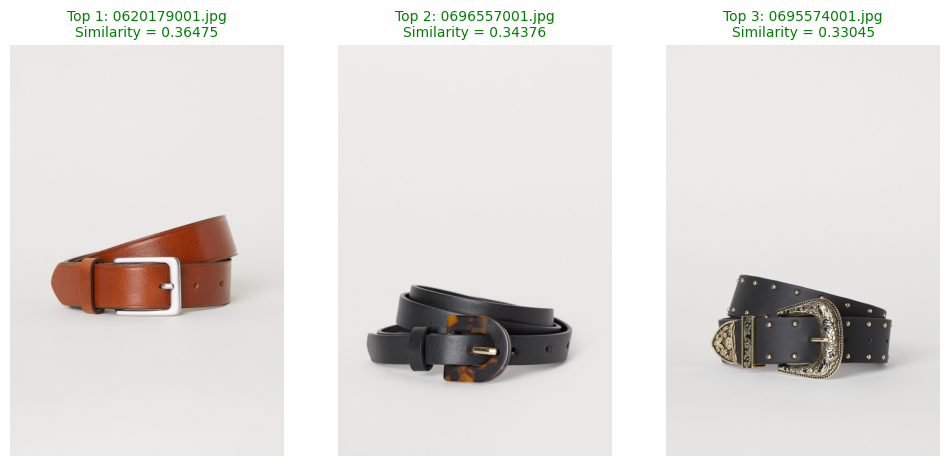

 2023-05-03 14:44:22 Powered by Azure Computer Vision Florence


,image_file,similarity
51,fashion/0620179001.jpg,0.364746
1227,fashion/0696557001.jpg,0.343756
1153,fashion/0695574001.jpg,0.330451
618,fashion/0642268001.jpg,0.308904
591,fashion/0641204001.jpg,0.297209
...,...,...
233,fashion/0623997001.jpg,0.127947
506,fashion/0629656005.jpg,0.126945
1308,fashion/0697532004.jpg,0.126283
1199,fashion/0696148002.jpg,0.124027


In [59]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 13

In [60]:
query = "butterfly hair pin"


Similar images using query = butterfly hair pin


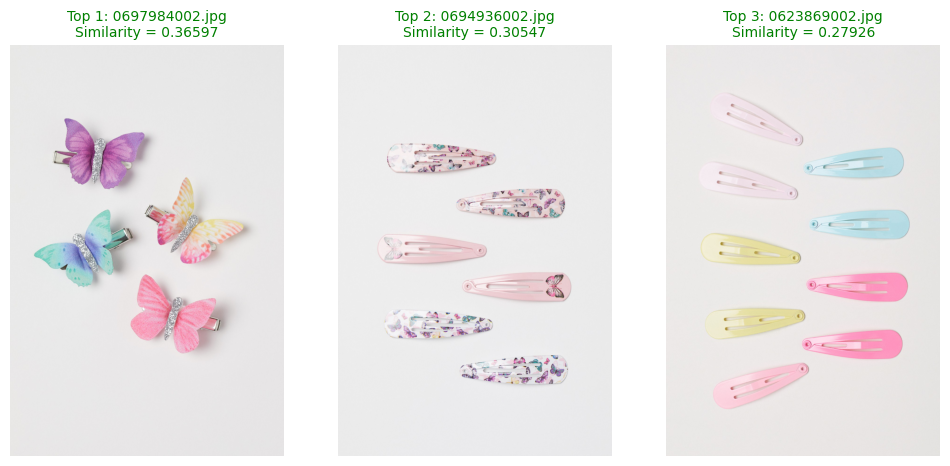

 2023-05-03 14:44:24 Powered by Azure Computer Vision Florence


,image_file,similarity
1338,fashion/0697984002.jpg,0.365971
1113,fashion/0694936002.jpg,0.305473
224,fashion/0623869002.jpg,0.279264
1288,fashion/0697112001.jpg,0.253906
500,fashion/0629485001.jpg,0.253191
...,...,...
1329,fashion/0697920007.jpg,0.062320
1330,fashion/0697920035.jpg,0.056385
760,fashion/0647207008.jpg,0.053628
1332,fashion/0697920055.jpg,0.053084


In [61]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 14

In [62]:
query = "shirt with shark, dolphin, fish or whale"


Similar images using query = shirt with shark, dolphin, fish or whale


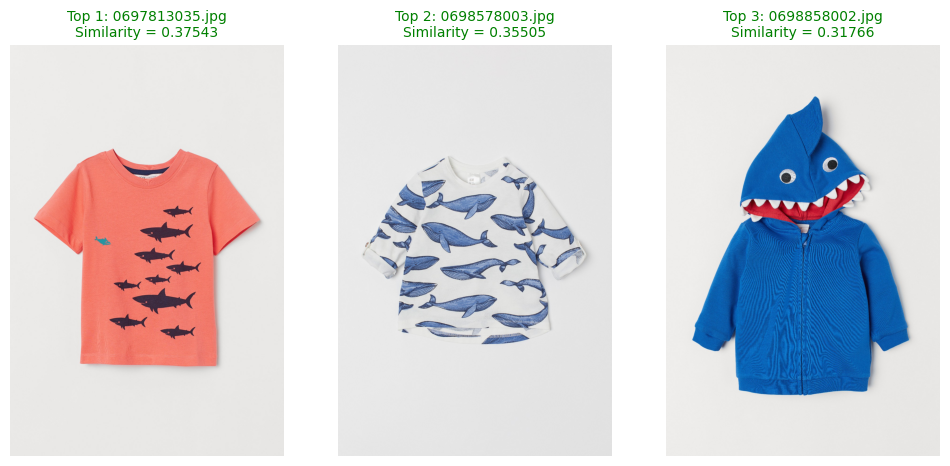

 2023-05-03 14:44:26 Powered by Azure Computer Vision Florence


,image_file,similarity
1323,fashion/0697813035.jpg,0.375435
1373,fashion/0698578003.jpg,0.355054
1388,fashion/0698858002.jpg,0.317663
1411,fashion/0699145001.jpg,0.307820
1464,fashion/0699923066.jpg,0.298483
...,...,...
850,fashion/0649555002.jpg,0.043159
581,fashion/0640990001.jpg,0.042459
580,fashion/0640989002.jpg,0.038560
785,fashion/0647946004.jpg,0.037140


In [63]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

> In the next notebook we will do some image clustering using vector embeddings